# GIS-E6020 Special Course in Geoinformatics: 
## Machine learning for semantic segmentation of satellite imagesto detect road networks and building footprints with ArcGIS APIfor Python

##### Arbenina Mariia
##### Spring 2021

# <font color=darkyellow>1. Task and data description</font>

### 1.1 General description of the task
- Using ML techniques, train a model on a labeled set of images to automatically detect roads and buildings from satellite imagery.

#### Supervised or unsupervised task?

- This is an implementation of a supervised machine learning approach with the use of labeled datasets of high resolution aerial (satellite) imagery.

#### Pattern detection or anomaly recognition?

- This is an pattern detection task. An ANN is tasked to detect pixels that constitute road networks and building footprints on the ground.

#### Why detect objects/semantically segment pixels from satellite imagery

- Urban planning and development
- Change detection
- Infrastructure planning
- Road networks planning
- Digital mapping (preparing basemaps)
- Navigation
- Geocoding (creating reference datasets for addressing)
- Disaster response
- Mass evacuation.

#### Object detection from manual to automated

- Digitizing roads and building footprints from imagery is a time-consuming task and is commonly done by digitizing features manually.
- Machine learning models have a capacity to learn complex semantics and can produce superior results.
- Hence, ML is used for road detection to reduce time and effort.

#### Input, expected output, potential challenges

- Input is made of two sets of nadir aerial images of the Earth + a set of labeled images with road centerlines (class "road) and the rest of the background (class "background") + a set of labeled images with building footprints, classes "building" and "background".
- Two shapefiles containing object geometry are also available.
- Expected output: images with roads and buildings correctly marked (predicted).

- Expected challenges: 
    - data preprocessing to be able to feed data into an ANN; 
    - choosing an appropriate ANN/model architecture to deal with satellite imagery; 
    - challenges for detection — obstruction of roads and buildings by trees, shadows, other buildings, etc.; 
    - overfitting during training;
    - post-processing of the inference results: turning detected objects into simple geometries. 

### 1.2 Data and labels

- **Dataset 1**: "Massachusetts Roads Dataset, Aerial Images of Massachusetts to aid Machine Learning for Aerial Image Labeling".
- Downloaded [from Kaggle](https://www.kaggle.com/balraj98/massachusetts-roads-dataset).
- Images: 1171 high resolution aerial images of the state of Massachusetts. 
- Each image chip covers 2.25 square km and is 1500x1500 pixels (height/width), 24 bit depth, RGB, TIFF format.
- Labels: a separate set of images with ground truth labels — two classes "road" and "background".
- The dataset covers 2600 square km and includes a variety of urban, suburban, and rural areas.
- Spatial resolution: 1 pixel per square meter.
- The target maps (images with labels) were generated by rasterizing road centerlines obtained from the OpenStreetMap project.
- Shapefile used for obtaining centerlines is available from [here](https://www.cs.toronto.edu/~vmnih/data/mass_roads/massachusetts_roads_shape.zip).


- **Dataset 2**: "Massachusetts Buildings Dataset, Aerial Images of Boston City to aid Machine Learning for Aerial Image Labeling".
- Downloaded [from Kaggle](https://www.kaggle.com/balraj98/massachusetts-buildings-dataset/).
- Images: 151 aerial images from the Boston area.
- Each image chip covers 2.25 square km and is 1500x1500 pixels (height/width), 24 bit depth, RGB, TIFF format.
- Labels: a separate set of images with ground truth labels — two classes "building" and "background".
- The entire dataset covers roughly 340 square kilometers and include urban and suburban areas and buildings of all sizes.
- Spatial resolution: 1 pixel per square meter. 
- The target maps (images with labels) were generated by rasterizing building footprints polygons obtained from the OpenStreetMap project.
- Shapefile used for obtaining centerlines is available from [here](https://www.cs.toronto.edu/~vmnih/data/mass_buildings/massachusetts_buildings_shape.zip).


### 1.3 Acknowledgements
The **datasets** are derived from Volodymyr Mnih's Massachusetts Satellite Imagery Dataset introduced in Chapter 6 of his PhD thesis ["Machine Learning for Aerial Image Labeling"](https://www.cs.toronto.edu/~vmnih/docs/Mnih_Volodymyr_PhD_Thesis.pdf).
The following citation acknowledges the authors contribution to the creation of the dataset used in this project:

@phdthesis{MnihThesis,
    author = {Volodymyr Mnih},
    title = {Machine Learning for Aerial Image Labeling},
    school = {University of Toronto},
    year = {2013}
}

**Additionally**, in this project I relied on **ArcGIS API for Python** cabailities and utilized [Deep learning in ArcGIS Pro documentation](https://pro.arcgis.com/en/pro-app/latest/help/analysis/image-analyst/deep-learning-in-arcgis-pro.htm) for a general overview of the workflow. Other specific sources are cited where appropriate.


# <font color=darkyellow>2. System modules and libraries</font>

### 2.1 To reproduce the results

To reproduce the results, the following environments, modules, and libraries are required:

- [ArcGIS API for Python](https://developers.arcgis.com/python/) — library for mapping, spatial analysis, data science, geospatial AI and automation
- ArcGIS Notebook (built on top of the Jupyter Notebook functionality) that leverages the ArcGIS Python environment to work with spatial data (e.g. satellite imagery, shapefiles, geometries).
- [Deep learning frameworks for ArcGIS](https://pro.arcgis.com/en/pro-app/latest/help/analysis/deep-learning/install-deep-learning-frameworks.htm).
- Deep Learning Libraries Installers for ArcGIS and instructions [can be found on Github](https://github.com/Esri/deep-learning-frameworks/blob/master/README.md?rmedium=links_esri_com_b_d&rsource=https%3A%2F%2Flinks.esri.com%2Fdeep-learning-framework-install).
- [Deep learning FAQ for ArcGIS Pro](http://downloads.esri.com/resources/imageanalyst/DeepLearning_FAQ.pdf)


In [1]:
import arcpy
from arcpy.ia import *
import arcgis.learn

In [2]:
import torch
import fastai
# testing CUDA in DL environment, should return True
torch.cuda.is_available()

True

In [3]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import numpy as np 
import os
import pandas as pd
import cv2

In [4]:
# Set the processor type environment to GPU
arcpy.env.processorType = "GPU"

In [5]:
# Check out the ArcGIS Image Analyst extension license 
arcpy.CheckOutExtension("ImageAnalyst")

'CheckedOut'

# <font color=darkyellow>3. Dowload data</font>

- Dowload datasets and shapefiles with geometries of roads and buildings of the state Massachussets:
    - [Massachusetts Roads Dataset](https://www.kaggle.com/balraj98/massachusetts-roads-dataset),
    - [Shapefile with roads geometry](https://www.cs.toronto.edu/~vmnih/data/mass_roads/massachusetts_roads_shape.zip),
    - [Massachusetts Buildings Dataset](https://www.kaggle.com/balraj98/massachusetts-buildings-dataset/),
    - [Shapefile with buildings geometry](https://www.cs.toronto.edu/~vmnih/data/mass_buildings/massachusetts_buildings_shape.zip).

- Unzip files into **/resources/** folder in the same directory as this Notebook.

# <font color=darkyellow>4. Data exploration</font>



In [33]:
# Explore what's in the dataset
# for dirname, _, filenames in os.walk('resources/MassachusettsDataRoads'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [7]:
metadata_df = pd.read_csv('resources/MassachusettsDataRoads/metadata.csv')

In [8]:
metadata_df.head()

,image_id,split,image_souce_url,label_source_url,tiff_image_path,tif_label_path,png_image_path,png_label_path
0,10078660_15,train,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,tiff/train/10078660_15.tiff,tiff/train_labels/10078660_15.tif,png/train/10078660_15.png,png/train_labels/10078660_15.png
1,10078675_15,train,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,tiff/train/10078675_15.tiff,tiff/train_labels/10078675_15.tif,png/train/10078675_15.png,png/train_labels/10078675_15.png
2,10078690_15,train,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,tiff/train/10078690_15.tiff,tiff/train_labels/10078690_15.tif,png/train/10078690_15.png,png/train_labels/10078690_15.png
3,10078705_15,train,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,tiff/train/10078705_15.tiff,tiff/train_labels/10078705_15.tif,png/train/10078705_15.png,png/train_labels/10078705_15.png
4,10078720_15,train,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,http://www.cs.toronto.edu/~vmnih/data/mass_roa...,tiff/train/10078720_15.tiff,tiff/train_labels/10078720_15.tif,png/train/10078720_15.png,png/train_labels/10078720_15.png


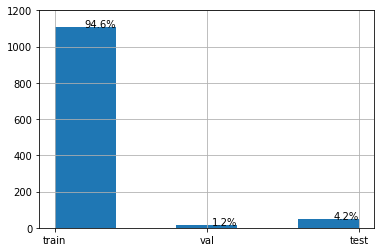

In [9]:
# Show distribution between train, validation, test data
plot1 = metadata_df['split'].hist(bins=5)

total = float(len(metadata_df))
for p in plot1.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    
    if percentage != "0.0%":
        plot1.annotate(percentage, (x, y), ha='right')

plt.style.use('classic')
plt.show(plot1)

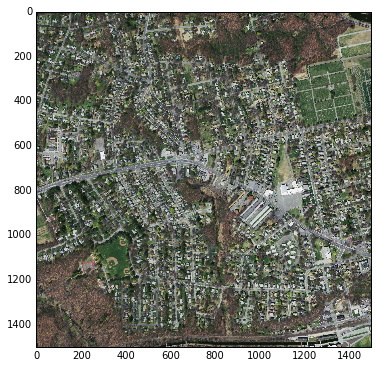

In [45]:
# Example of a satellite image for road detection
plt.figure(figsize=(6,6))
img1 = mpimg.imread('resources/10528735_15.png')
imgplot = plt.imshow(img1)
plt.show()

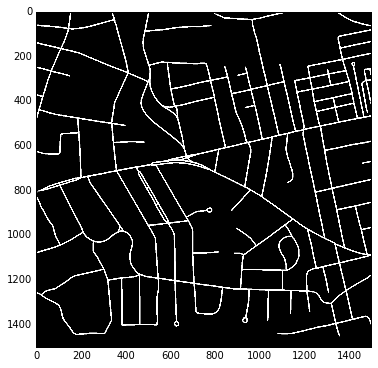

In [46]:
# Example of a classified image with detected roads
plt.figure(figsize=(6,6))
img1 = mpimg.imread('resources/10528735_15_label.png')
imgplot = plt.imshow(img1)
plt.show()

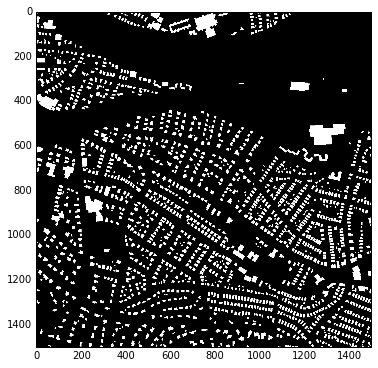

In [47]:
# Example of a classified image with building footprints
plt.figure(figsize=(6,6))
img1 = mpimg.imread('resources/22679005_15.png')
imgplot = plt.imshow(img1)
plt.show()

# <font color=darkyellow>5. Data preprocessing</font>


The following workflow is implemented on two subsets of both datasets to be able to run the model training on a local machine's GPU but it can be easily adapted to include the whole dataset.

If the workflow is reproduced in ArcGIS Pro environment, there are several native tools to prepare the data for machine learning and deep learning:
    - Training Samples Manager to manually create an image classification schema by marking shapes on an image that belong to different classes.
    - Label Objects for Deep Learning with similar functionality that also exports training data in a required format.
    - Export Training Data For Deep Learning tool that allows to create training datasets to support deep learning applications such as TensorFlow, Keras, PyTorch, CNTK.
    
Depending on data at hand and the machine learning task, labeled input data can be generated in the following formats: 
    - KITTI rectangles (object detection), 
    - PASCAL VOC rectangles (object detection), 
    - Classified Tiles (pixel classification), 
    - RCNN Masks (object detection), 
    - Labeled Tiles (object classification), 
    - Multi-labeled Tiles (object classification), 
    - Export Tiles (no labels, for image enhancement).
    
Different formats fit different data structures and models/NNs architectures. For more info, [see this page](https://pro.arcgis.com/en/pro-app/latest/tool-reference/image-analyst/export-training-data-for-deep-learning.htm).

### 5.1. Preparing roads and buildings data for training

Using **arcgis.learn** module and subsets of Massachussets roads and buildings datasets, two sets of input training data were created in the following formats:
    - For road dataset: 8-bit 256x256 image chips + classified tiles (image chips with classified pixels) + class statistics in .json and .txt formats.
    - For buildings dataset: 8-bit 256x256 image chips + classified tiles (image chips with classified pixels) + class statistics in .json and .txt formats.
    
The 8-bit 256x256 image chips for training were generated from the original 1500x1500 24-bit RGB images to be able to handle them with local machine's GPU. To classify pixels and prepare training inputs, shapefiles with geometries denoting buildings and roads were used. **Note:** the original datasets include already classified image tiles with pixels that either belong to buildings/roads or background, but due to the use of ArcGIS API for Python for training and GPU limilations, the process of generating labeled tiles was repeated for smaller image chips for subsets of the original data.

If the workflow is reproduced in ArcGIS Pro, there is a native tool that does the same: Export Training Data For Deep Learning.

Visualized, the shapefiles with object geometries overlayed with a map can be displayed as following (green lines = roads, blue polygons = building footprints):
    

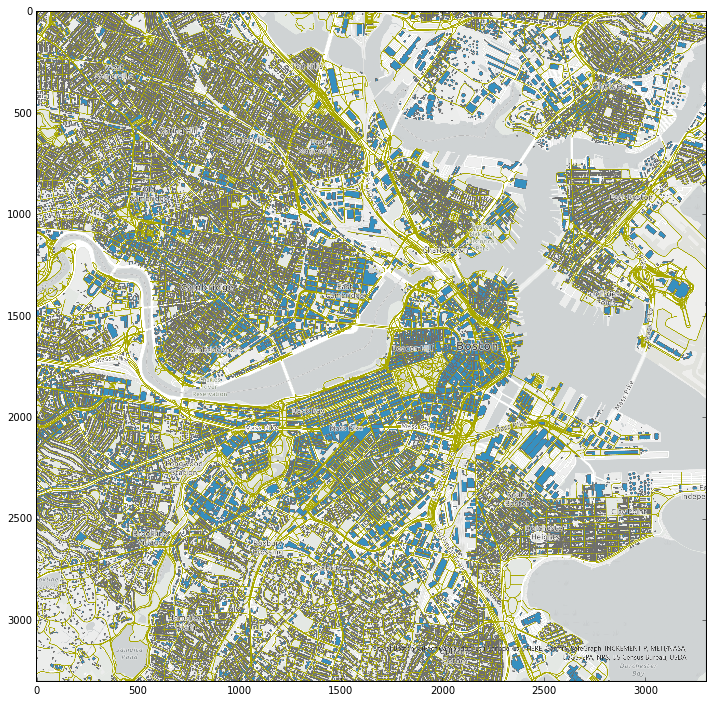

In [49]:
plt.figure(figsize=(12,12))
img1 = mpimg.imread('resources/Roads_wBuildigs.png')
imgplot = plt.imshow(img1)
plt.show()

In [81]:
# Set local variables for creating a training dataset from a sample of roads dataset
inRaster = "resources/Roads_subset"
out_folder = "training_data/roads_train"
in_training = "resources/massachusetts_roads_shape/massachusetts-roads_corrected_orig.shp"
image_chip_format = "TIFF"
tile_size_x = "256"
tile_size_y = "256"
stride_x= "128"
stride_y= "128"
output_nofeature_tiles= "ONLY_TILES_WITH_FEATURES"
metadata_format= "Classified_Tiles"
start_index = 0
classvalue_field = None
buffer_radius = 3
in_mask_polygons = None
rotation_angle = 0
reference_system = "MAP_SPACE"
processing_mode = "PROCESS_AS_MOSAICKED_IMAGE"
blacken_around_feature = "NO_BLACKEN"
crop_mode = "FIXED_SIZE"

# Create a traning dataset 
ExportTrainingDataForDeepLearning(inRaster, out_folder, in_training, 
    image_chip_format,tile_size_x, tile_size_y, stride_x, 
    stride_y,output_nofeature_tiles, metadata_format, start_index, 
    classvalue_field, buffer_radius, in_mask_polygons, rotation_angle, 
    reference_system, processing_mode, blacken_around_feature, crop_mode)

<geoprocessing server result object object at 0x000001D642715DE0>

In [82]:
# Set local variables for creating a training dataset from a sample of buildings dataset
inRaster = "resources/Buildings_subset"
out_folder = "training_data/buildings_train_tiles"
in_training = "resources/massachusetts_buildings_shape/massachusetts-buildings_corrected.shp"
image_chip_format = "TIFF"
tile_size_x = "256"
tile_size_y = "256"
stride_x= "128"
stride_y= "128"
output_nofeature_tiles= "ONLY_TILES_WITH_FEATURES"
metadata_format= "Classified_Tiles"
start_index = 0
classvalue_field = None
buffer_radius = 0
in_mask_polygons = None
rotation_angle = 0
reference_system = "MAP_SPACE"
processing_mode = "PROCESS_AS_MOSAICKED_IMAGE"
blacken_around_feature = "NO_BLACKEN"
crop_mode = "FIXED_SIZE"

# Create a traning dataset 
ExportTrainingDataForDeepLearning(inRaster, out_folder, in_training, 
    image_chip_format,tile_size_x, tile_size_y, stride_x, 
    stride_y,output_nofeature_tiles, metadata_format, start_index, 
    classvalue_field, buffer_radius, in_mask_polygons, rotation_angle, 
    reference_system, processing_mode, blacken_around_feature, crop_mode)

<geoprocessing server result object object at 0x000001D6427155D0>

#### To create a training dataset in a required format:

- More info on ExportTrainingDataForDeepLearning parameters [can be found here](https://pro.arcgis.com/en/pro-app/latest/tool-reference/image-analyst/export-training-data-for-deep-learning.htm).

### 5.2 Data preprocessing results

Using a subset of original data (22 image tiles 1500x1500 from each dataset) the following training data were created:

    - training_data/roads_train (1990 image chips 256x256x3 size, classified image chips, class statistics in .json and .txt)
    - training_data/buildings_train (2053 image chips 256x256x3 size, metadata containing KITTI rectangles in .txt, class statistics in .json and .txt)

# <font color=darkyellow>6. Model training and validation</font>


### 6.1 Model architecture

For semantic segmentation (pixel classification) the following models are available via ArcGIS Python API:

- [U-net Classifier](https://developers.arcgis.com/python/guide/how-unet-works/)
- [PSPNet](https://developers.arcgis.com/python/guide/how-pspnet-works/)
- [DeepLabV3](https://developers.arcgis.com/python/guide/how-deeplabv3-works/)

For this project, **U-net Classifier was chosen** based on model metrics after different models were demo-trained on a small subset of images using ArcGIS Pro native tools. 

**U-net architecture** includes parts to "encode" input data and to "decode" the prediction output onto the pixel space. It was [originally used for biomedical image segmentation](https://arxiv.org/abs/1505.04597), and is commonly used for land cover classification, building or roads extraction, and other image classification tasks. As a "backbone" model in the encoder half, a pre-trained VGG or ResNet NN is used to encode the input image through convolution layers and maxpool downsampling. The decoder part uses upsampling (transposed convolution), concatenation, and convolution operations to semantically project learnt features onto the pixel space.

More info on convolution, pooling, transposed convolution, etc:
[“A guide to convolution arithmetic for deep learning”](https://arxiv.org/pdf/1603.07285.pdf)

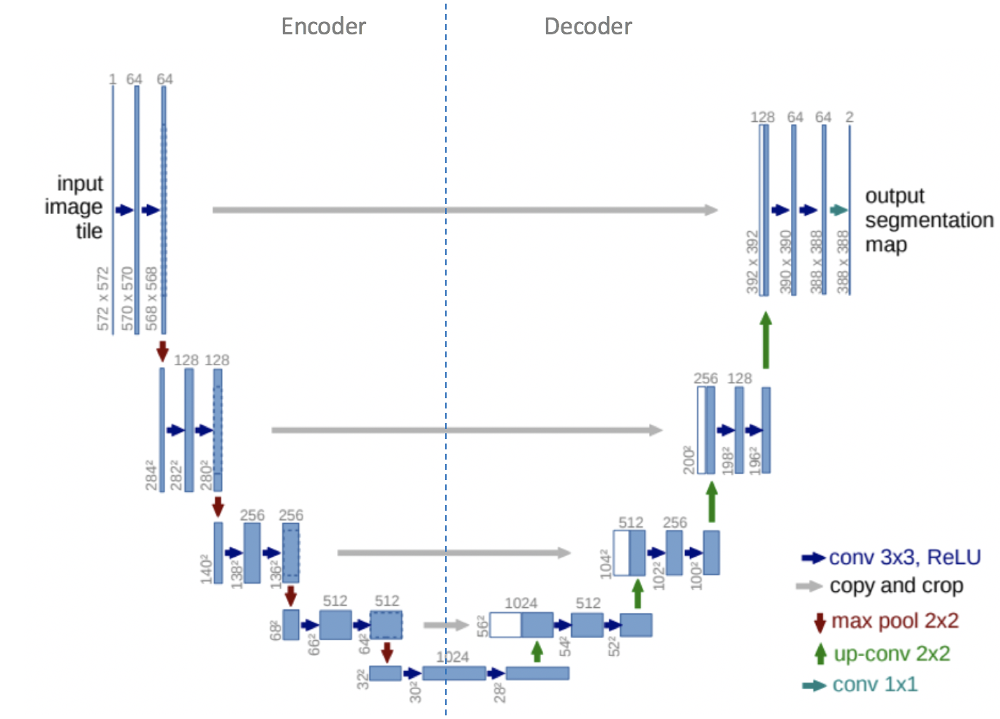

### 6.2 Model training: Roads


In [6]:
from arcgis.learn import UnetClassifier, PSPNetClassifier, DeepLab, prepare_data, classify_pixels

Note:
   - Unet Classifier uses a ResNet-34 NN by default pre-trained on [ImageNet](http://www.image-net.org/) Stanford's open dataset for advancing computer vision.
   - Reduce **batch_size** if getting CUDA Out of memory error.
   - **prepare_data** method applies random transformation such as randomly zooming, rotating, flipping to create more diverse syntetic data as a way to create more generalizable model.


In [30]:
rdata = prepare_data(path='training_data/roads_train', chip_size=256, batch_size=4)

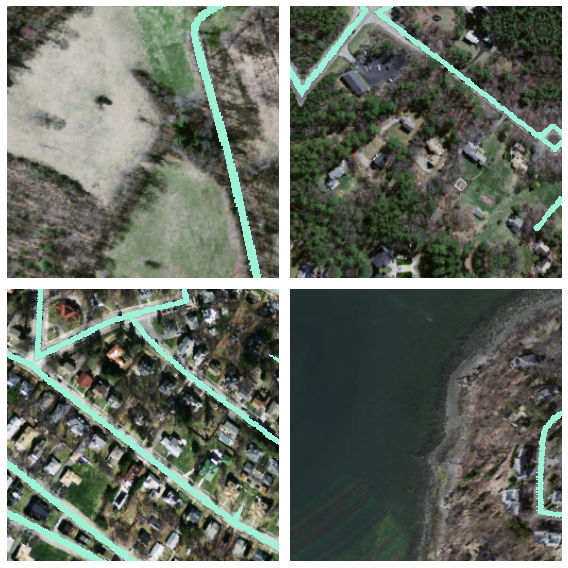

In [29]:
# To visualize a small random batch of the data
rdata.show_batch(alpha=1)
plt.show()

In [7]:
# To tackle issues with CUDA running out of memory, the batch size is decreased before instantiating a model
rdata = prepare_data(path='training_data/roads_train', chip_size=256, batch_size=2)

In [8]:
# Instantiating Unet model
# class_balancing — optional boolean; if True, it will balance the cross-entropy loss inverse to the frequency of pixels per class
unet_model = UnetClassifier(rdata)

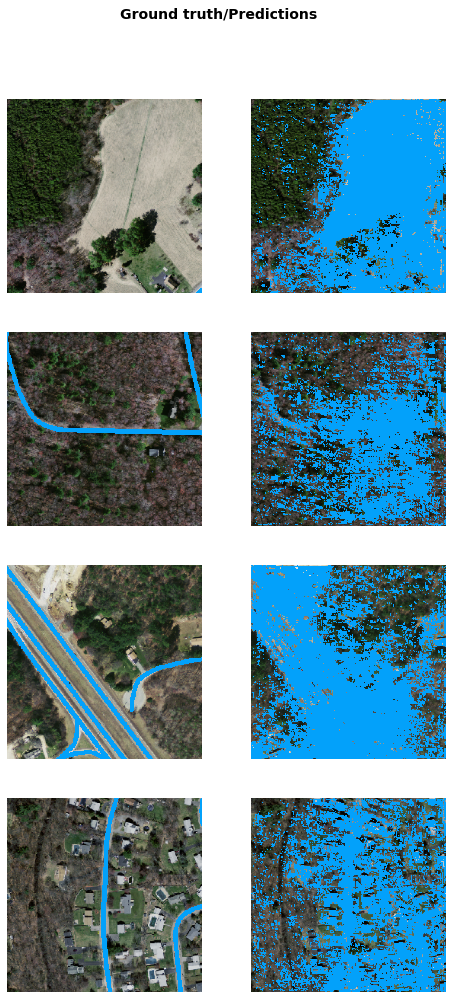

In [132]:
# The untrained model prediction output
# The predictions don't match the ground truth at all (masks are random on the right side)
unet_model.show_results(rows=5, alpha=1)
plt.show()

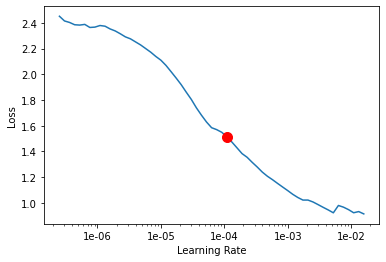

0.00010964781961431851

In [9]:
# Determine optimal learning rate via a learning rate finder that starts training from a very small lr gradually increasing it
# The error is going down until it reaches the point after which the loss starts going up again
unet_model.lr_find()

In [10]:
# parameters: num of epochs, learning rate
unet_model.fit(5, lr=1.09e-4)

epoch     train_loss  valid_loss  accuracy  dice      time    
0         0.163630    0.149808    0.947317  0.371182  19:44     
1         0.127745    0.117472    0.956136  0.511550  18:48     
2         0.111741    0.107205    0.960489  0.619290  17:34     
3         0.105614    0.101023    0.962914  0.622302  16:37     
4         0.106557    0.099376    0.963197  0.634788  16:48     


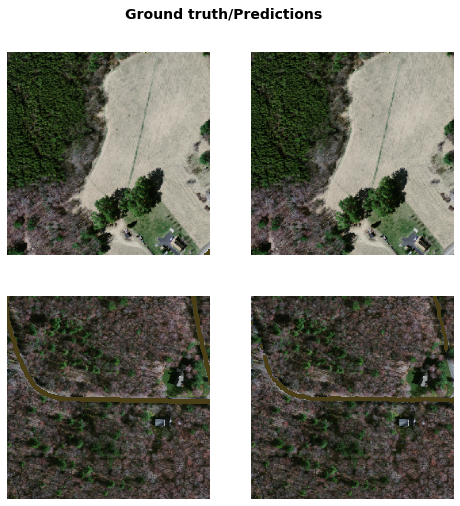

In [46]:
unet_model.show_results(rows=5, alpha=1.0)
plt.show()

**NOTE:** The color of road is randomly generated. Here it is dark brown, so barely visible.

### 6.2.1 Model evalution: Roads


In [47]:
# Overal model's pixel accuracy
unet_model.accuracy()

0.9679900407791138

**BUT**: 

[Pixel accuracy might not be the optimal metric](https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2) due to the class imbalance in the dataset (road class is underrepresented compared to background class).

In [48]:
"""
NoData stands for "background" and Undefined is "road" class
"""
unet_model.per_class_metrics()

,NoData,Undefined
precision,0.978130,0.757260
recall,0.987245,0.655321
f1,0.982600,0.687105


In [49]:
# Computes IOU on the validation set for each class. 
# If mean IOU is needed, use parameter mean=True
unet_model.mIOU()

{'0': 0.9661744407578255, 'Undefined': 0.5683065973189403}

In [ ]:
unet_model.mIOU(mean=True)

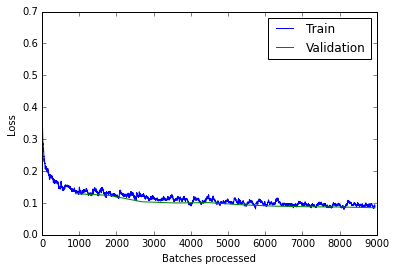

In [50]:
unet_model.plot_losses()
plt.show()

In [155]:
# Save model
unet_model.save('models/unet_model_roads_2')

Computing model metrics...


WindowsPath('models/unet_model_roads')

### 6.3 Model training: Buildings

In [52]:
# To visualize a small random batch of the data
bdata = prepare_data(path='training_data/buildings_train_tiles', chip_size=256, batch_size=4)

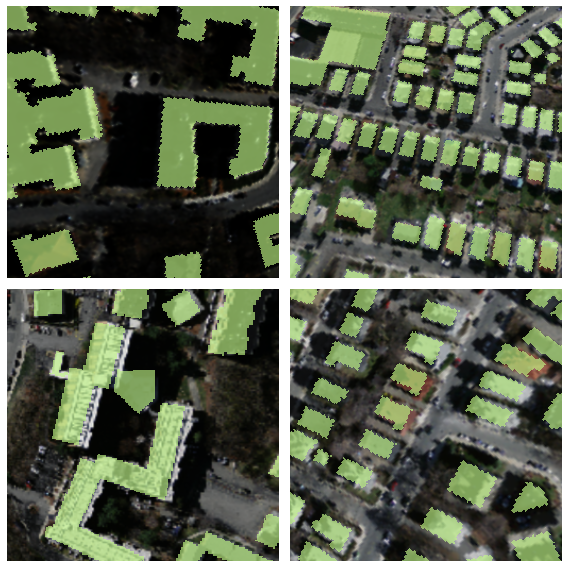

In [40]:
bdata.show_batch(alpha=0.8)
plt.show()

In [18]:
# To tackle issues with CUDA running out of memory, the batch size is decreased before instantiating a model
bdata = prepare_data(path='training_data/buildings_train_tiles', chip_size=256, batch_size=2)

In [19]:
# Instantiating Unet model with a backbone model ResNet-18 that consists of 18 layers (default is 34 layers)
unet_model_b = UnetClassifier(bdata, backbone="resnet18")

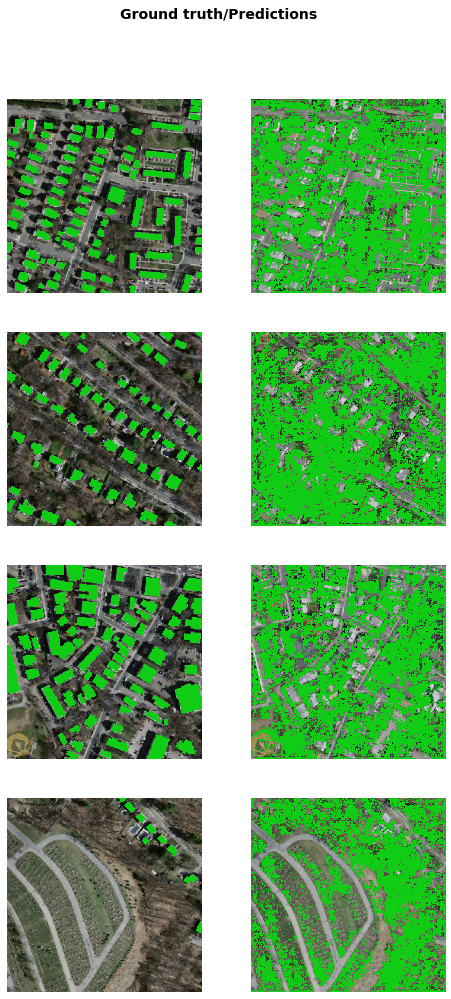

In [176]:
# The untrained model prediction output
# The predictions don't match the ground truth at all (masks are random on the right side)
unet_model_b.show_results(rows=5, alpha=1)
plt.show()

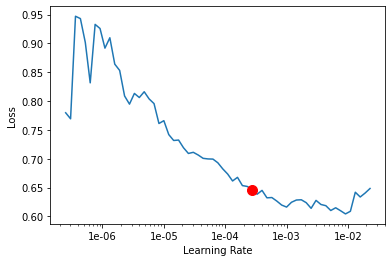

0.0002754228703338166

In [20]:
# Determine optimal learning rate via a learning rate finder that starts training from a very small lr gradually increasing it
# The error is going down until it reaches the point after which the loss starts going up again
unet_model_b.lr_find()

In [21]:
# parameters: num of epochs, learning rate
unet_model_b.fit(5, lr=1e-03)

epoch     train_loss  valid_loss  accuracy  dice      time    
0         0.343229    0.342869    0.874229  0.574806  20:23     
1         0.297725    0.234993    0.899743  0.623163  18:33     
2         0.247843    0.216665    0.909050  0.664352  18:07     
3         0.233758    0.198786    0.916940  0.687583  16:58     
4         0.228270    0.197346    0.916800  0.691944  17:45     


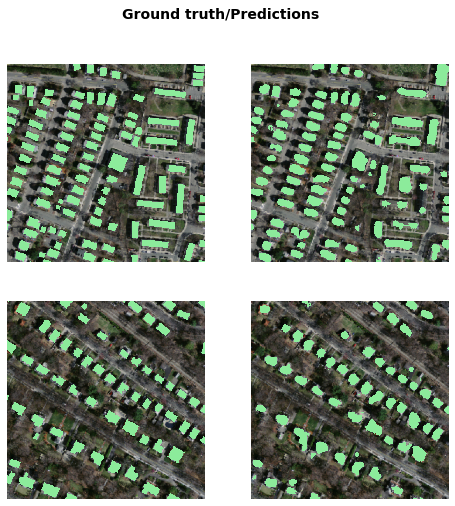

In [28]:
unet_model_b.show_results(rows=5, alpha=1.0)
plt.show()

### 6.3.1 Model evaluation: Buildings


In [22]:
# Overal model's pixel accuracy
unet_model_b.accuracy()

0.9168000221252441

In [23]:
"""
NoData stands for "background" and Undefined is "building" class
"""
unet_model_b.per_class_metrics()

,NoData,Undefined
precision,0.942512,0.705500
recall,0.950214,0.702035
f1,0.945579,0.692146


In [24]:
# Computes mean IOU on the validation set for each class.
unet_model_b.mIOU()

{'0': 0.9024581456144551, 'Undefined': 0.581022715527756}

In [25]:
unet_model_b.mIOU(mean=True)

0.7417404305711055

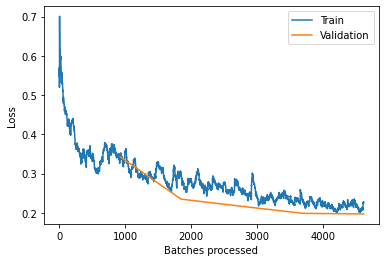

In [26]:
unet_model_b.plot_losses()
plt.show()

In [27]:
# Save model
unet_model_b.save('models/unet_model_buildings_2')

Computing model metrics...


WindowsPath('models/unet_model_buildings_2')

### 7. Essential metrics for semantic segmentation

The following [metrics essential for semantic segmentation](https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2) were considered during model performance evaluation:

- **Pixel accuracy** — the percentage of correctly classified pixels of an image. Might be tricky for model performance evaluation if there is class imbalance in the data. In case with road dataset, background class take up the majority of pixels while roads are underrepresented. Even with e.g. segmentation accuracy of 95%, if the rest of the pixels (5%) that belong to roads are classified incorrectly, the model's predictions are useless.
- **IoU, Jaccard Index** — Intersection-Over-Union (IoU), Area of Overlap/Area of Union. The area of overlap between the predicted pixels and the ground truth divided by the area of union between them (pixels that belong to the same class in both prediction and ground truth minus their overlap). Ranges from 0 to 1 where 0 denotes no overlap and 1 — fully overlapping pixel segmentation. In case with binary unbalanced classes, mean IoU is a more accurate metric for model evaluation than the pixel accuracy. 
- **Dice Coefficient (F1 Score)** — (2 x the area of overlap) / (total pixels in both images) calculated for each class. Then, the mean of dice can be calculated for both classes. The Dice Coefficient is positively correlated with the IoU. Read on the difference between them [here](https://stats.stackexchange.com/a/276144).
- **Precision** — shows how many of the true predcitions are actually true; **TP/(TP+FP)**. Example: when predicting roads, precision of 60% means that the model is correct 60% of the time.
- **Recall** — or *sensitivity*; shows how many of actually true instances are correctly predicted, in other words — how many of true instances the model is able to predict; **TP/(TP+FN)**. Example: recall of 75% for road detection means that the model if able to correctly identify 75% of roads or that 75% of actual roads were correctly classified.

More on precision and recall is [here](https://developers.google.com/machine-learning/crash-course/classification/precision-and-recall).

# <font color=darkyellow>7. Model testing</font>


- To test the models, a native tool in ArcGIS Pro environment was used to apply a model to a randomly chosen satellite image tile. 
- Each model was tested on a single aerial image tile of 1500x1500 pixel size and the results were visually assessed.
- Raster layers were generated with predicted pixels denoting roads and buildings. They can be futher manipulated in ArcGIS Pro environment to create simple geometries.
- The code implemetation of the testing is also possible but is not yet included in this workflow.

Images of groung truth labels and test results to compare:

- Picture 1: Ground truth labels of buildings overlapping satellite imagery tile and the background map.
- Picture 2: Predicted pixels of buildings on the same background.
- Picture 3: Ground truth labels of roads overlapping satellite imagery tile and the background map.
- Picture 4: Predicted pixels of roads on the same background.
- Predicted pixels roughly follow the building footprints and road shapes.
- The accuracy can be improved by further training or by generating simplified shapes from rasters.

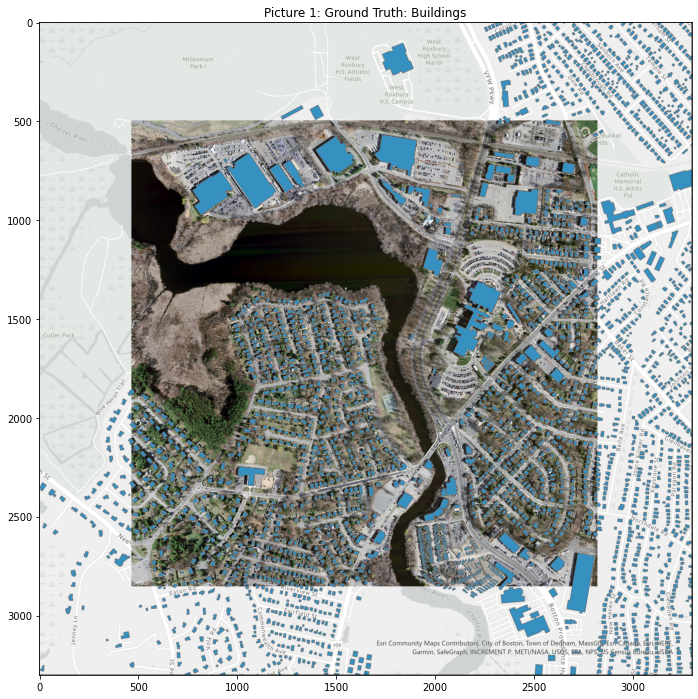

In [31]:
plt.figure(figsize=(12,12))
img1 = mpimg.imread('resources/Buildings_test_GroundTruth.png')
imgplot = plt.imshow(img1)
plt.title('Picture 1: Ground Truth: Buildings')
plt.show()

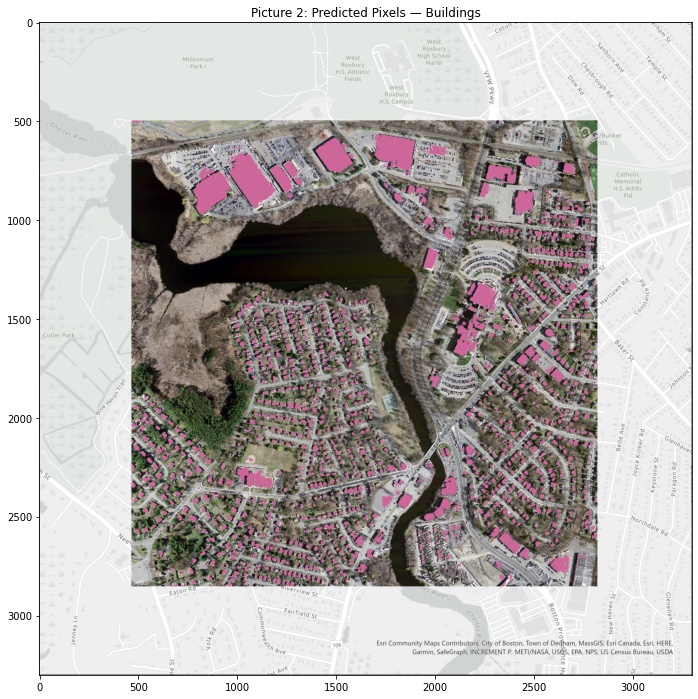

In [32]:
plt.figure(figsize=(12,12))
img1 = mpimg.imread('resources/Buildings_test_Prediction.png')
imgplot = plt.imshow(img1)
plt.title('Picture 2: Predicted Pixels — Buildings')
plt.show()

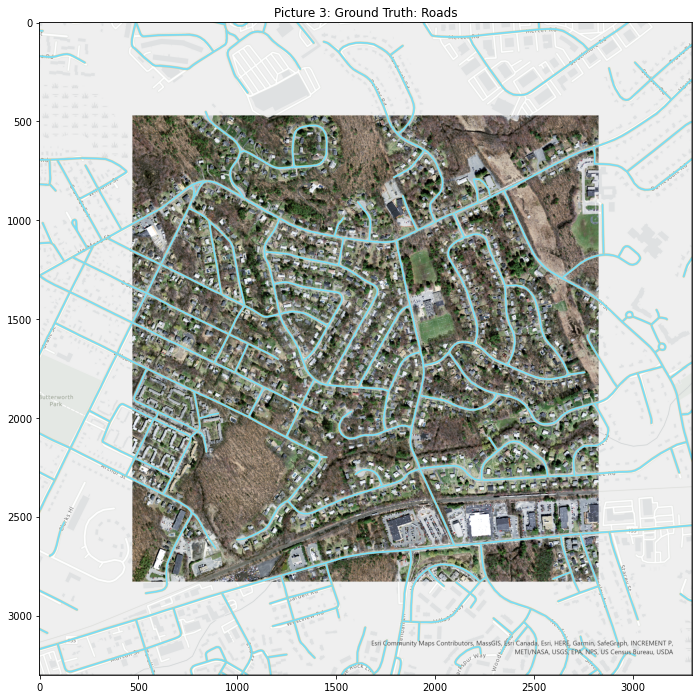

In [29]:
plt.figure(figsize=(12,12))
img1 = mpimg.imread('resources/Roads_test_GroundTruth.png')
imgplot = plt.imshow(img1)
plt.title('Picture 3: Ground Truth: Roads')
plt.show()

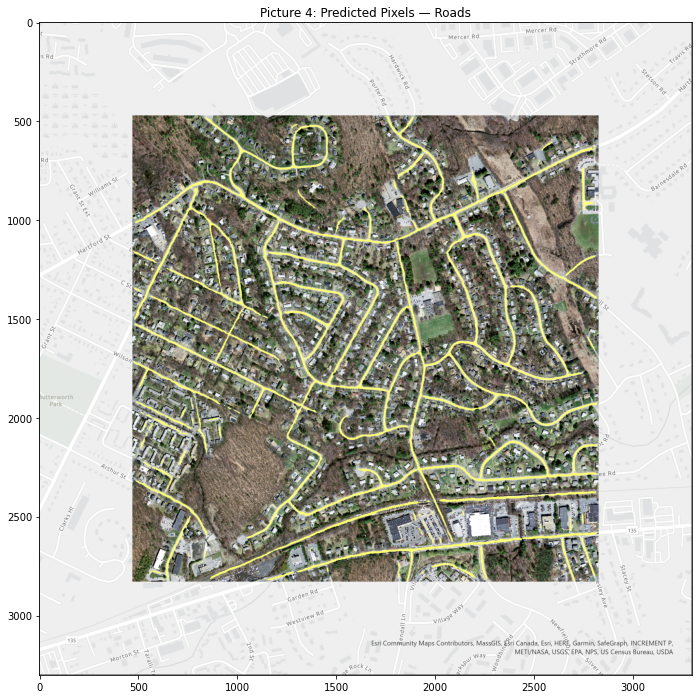

In [30]:
plt.figure(figsize=(12,12))
img1 = mpimg.imread('resources/Roads_test_Prediction.png')
imgplot = plt.imshow(img1)
plt.title('Picture 4: Predicted Pixels — Roads')
plt.show()

### ***--- The End***